# __ Análisis de Personalidades__
***
- Sergio Vozmediano Ávilas
- Aprendizaje Automático
- MBA Big Data
- Universidad Europea de Madrid
***
## __ Introducción __

El indicador de personalidad de Myers Briggs (MBTI) es un sistema de representación de los tipos de personalidad, que sirve para que las personas se conozcan mejor a sí mismas. Este sistema divide los tipos de personalidad en 4 ejes. 

- Introversion (I) – Extroversion (E)
- Intuition (N) – Sensing (S)
- Thinking (T) – Feeling (F)
- Judging (J) – Perceiving (P)

Cada personalidad es categorizada en función de la elección en cada uno de los ítems. De este modo, existen 16 posibles combinaciones que dan lugar a los tipos de personalidades definidos en el sistema MBTI.

<img width = 30% src="https://upload.wikimedia.org/wikipedia/commons/e/e6/CognitiveFunctions.png" />

***

## __ Objetivos de la Actividad __
En la presente actividad se pretende hacer uso de algoritmos de aprendizaje automático, para intentar predecir el tipo de personalidad de una persona en la escala MBTI, basándose exclusivamente en contenido escrito y publicado en la web por dicha persona.

### __ Fichero fuente: __ `Personality.csv`

Fichero csv con 8675 registros y dos propiedades por registro:
- Category --> Tipo de personalidad 
- Text --> Texto 

El fichero fuente ha sido preprocesado previamente, realizando las siguientes operaciones sobre el contenido del mismo:
- Eliminación de símbolos de puntuación
- Caracteres transformados a minúsculas
- Eliminación de caracteres alfanuméricos
- Eliminación de palabras de parada
- Stemming (Reducción de palabras a su raíz)
***

### Importación de las librerías necesarias para el procesado y visualización de los datos
***

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Lectura del fichero csv preprocesado
***

In [2]:
df = pd.read_csv('./Documents/personality_.csv', engine = 'python', skipinitialspace=True)
df.shape

(8675, 2)

### Conteo del número de palabras por documento (post)
***

In [3]:
def var_row(row):
    l = []
    for i in row.split('|||'):
        l.append(len(i.split()))
    return np.var(l)

df['words_per_post'] = df['Text'].apply(lambda x: len(x.split())/50)
df.head()

,Category,Text,words_per_post
0,INFJ,http wwwyoutubecomwatch.http.enfp intj moment ...,6.04
1,ENTP,find lack post alarm.sex bore posit often exam...,10.50
2,INTP,good one http wwwyoutubecomwatch vfhigbolffgw....,7.92
3,INTJ,dear intp enjoy convers day esoter gab natur u...,9.72
4,ENTJ,fire.anoth silli misconcept approach logic go ...,8.98


### Gráfico de distribución del número de palabras por documento y personalidad
***

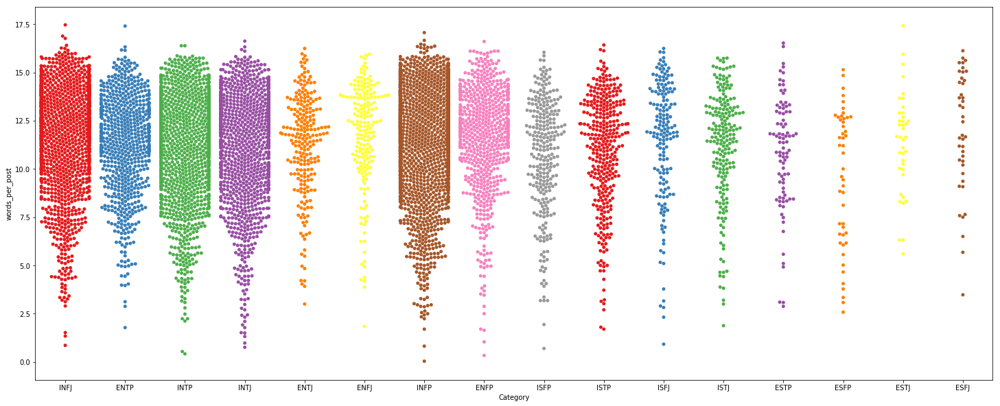

In [4]:
plt.figure(figsize=(25,10))
sns.swarmplot("Category", "words_per_post", data=df, palette="Set1")

### Número de ocurrencias de cada tipo de personalidad MBTI
***

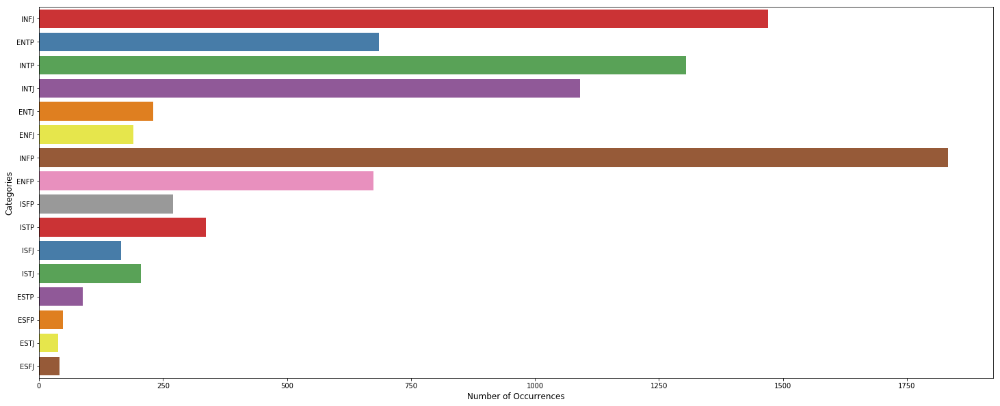

In [5]:
import re
from matplotlib.pyplot import *
%matplotlib inline

plt.figure(figsize=(25,10))
sns.countplot(data=df, y='Category', palette="Set1")
plt.xlabel('Number of Occurrences', fontsize=12)
plt.ylabel('Categories', fontsize=12)
plt.show()

## Modelo 1
### Árbol de Decisión Simple
***

In [6]:
from sklearn.metrics import classification_report, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_extraction.text import CountVectorizer

In [7]:
cntizer = CountVectorizer()  

X_cnt = cntizer.fit_transform(np.array(df.Text))
Y_cnt = np.array(df.Category)

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier


X = X_cnt
y = Y_cnt


X_train_val, X_test, Y_train_val, Y_test = train_test_split(X, y, test_size=0.15, random_state=0)
X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, test_size=0.15/0.85, random_state=0)

treeM = DecisionTreeClassifier(max_depth = 15)
treeM.fit(X_train, Y_train)
treeM.get_params()
print(treeM.score(X_train, Y_train))

y_pred = treeM.predict(X_val)

print(classification_report(Y_val,
                            y_pred,
                            target_names=df.Category.unique()))

0.8420359084170648
             precision    recall  f1-score   support

       INFJ       0.24      0.16      0.19        31
       ENTP       0.59      0.54      0.56       110
       INTP       0.10      0.09      0.10        32
       INTJ       0.48      0.40      0.44       118
       ENTJ       0.17      0.25      0.20         4
       ENFJ       0.00      0.00      0.00         6
       INFP       0.00      0.00      0.00         4
       ENFP       0.00      0.00      0.00        13
       ISFP       0.59      0.66      0.62       210
       ISTP       0.56      0.69      0.62       279
       ISFJ       0.53      0.53      0.53       160
       ISTJ       0.56      0.60      0.58       180
       ESTP       0.50      0.28      0.36        25
       ESFP       0.53      0.21      0.30        47
       ESTJ       0.46      0.35      0.40        34
       ESFJ       0.56      0.47      0.51        49

avg / total       0.52      0.53      0.52      1302



### Gráfico de Árbol de Decisión Simple

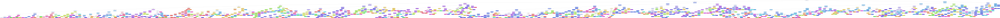

In [9]:
from graphviz import Source
from sklearn import tree
Source( tree.export_graphviz(treeM, out_file=None))

graph = Source( tree.export_graphviz(treeM, out_file=None, filled = True, rounded = True))
png_bytes = graph.pipe(format='png')
with open('dtree_pipe.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

### Matriz de Confusión Árbol de Decisión Simple (Reales vs Predichos)

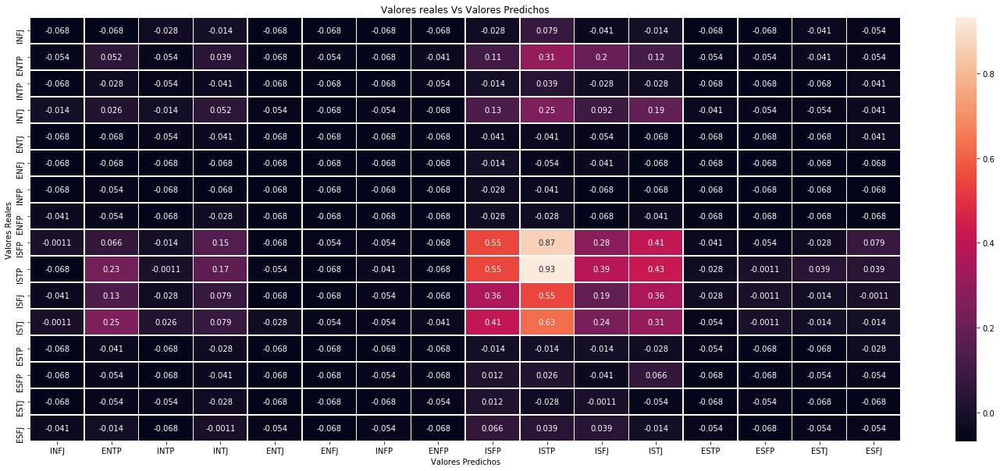

In [10]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cnf_matrix = confusion_matrix(Y_test, y_pred)
np.set_printoptions(precision=2)

#Normalize data
df_norm = (cnf_matrix - cnf_matrix.mean()) / (cnf_matrix.max() - cnf_matrix.min())
# Plot normalized confusion matrix
plt.figure(figsize=(25,10))
plt.title('Valores reales Vs Valores Predichos')

sns.heatmap(df_norm, annot = True, linewidths=.5, xticklabels = df['Category'].unique(), yticklabels = df['Category'].unique())
plt.xlabel('Valores Predichos')
plt.ylabel('Valores Reales')
plt.show()

***

## Modelo 2
### Bosque Aleatorio
***

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

X = X_cnt
y = Y_cnt

X_train_val, X_test, Y_train_val, Y_test = train_test_split(X, y, test_size=0.15, random_state=0)
X_train, X_val, Y_train, Y_val = train_test_split(X_train_val, Y_train_val, test_size=0.15/0.85, random_state=0)

forest = RandomForestClassifier(max_depth = 20, n_estimators = 50)
forest.fit(X_train, Y_train)
forest.get_params()
print(forest.score(X_train, Y_train))

y_pred = forest.predict(X_val)

print(classification_report(Y_val,
                            y_pred,
                            target_names=df.Category.unique()))

0.7853730851589524
             precision    recall  f1-score   support

       INFJ       0.00      0.00      0.00        31
       ENTP       0.00      0.00      0.00       110
       INTP       0.00      0.00      0.00        32
       INTJ       1.00      0.01      0.02       118
       ENTJ       0.00      0.00      0.00         4
       ENFJ       0.00      0.00      0.00         6
       INFP       0.00      0.00      0.00         4
       ENFP       0.00      0.00      0.00        13
       ISFP       0.37      0.30      0.33       210
       ISTP       0.28      0.92      0.42       279
       ISFJ       0.64      0.14      0.23       160
       ISTJ       0.45      0.42      0.43       180
       ESTP       0.00      0.00      0.00        25
       ESFP       0.00      0.00      0.00        47
       ESTJ       0.00      0.00      0.00        34
       ESFJ       0.00      0.00      0.00        49

avg / total       0.35      0.32      0.24      1302



C:\Users\Sergio\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### Matriz de Confusión Bosque Aleatorio (Reales vs Predichos)

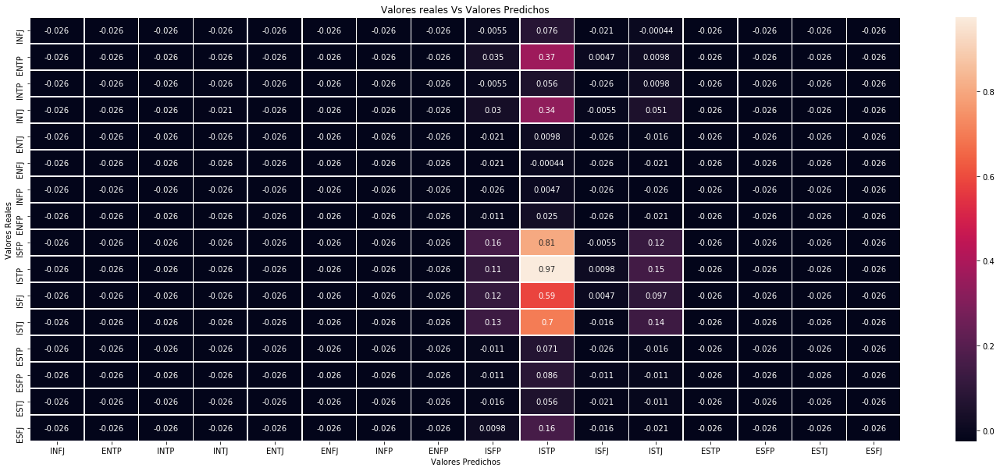

In [12]:
from sklearn.metrics import confusion_matrix

cnf_matrix = confusion_matrix(Y_test, y_pred)
np.set_printoptions(precision=2)

#Normalize data
df_normal = (cnf_matrix - cnf_matrix.mean()) / (cnf_matrix.max() - cnf_matrix.min())

plt.figure(figsize=(25,10))
plt.title('Valores reales Vs Valores Predichos')
sns.heatmap(df_normal, annot = True, linewidths=.5, xticklabels = df['Category'].unique(), yticklabels = df['Category'].unique())
plt.xlabel('Valores Predichos')
plt.ylabel('Valores Reales')
plt.show()

***
## Nubes de Palabras por Tipo de Personalidad MBTI
***

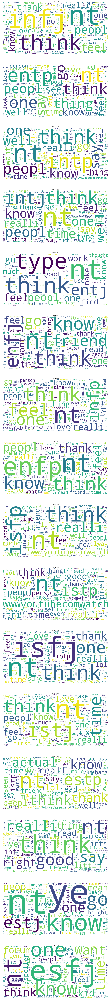

In [13]:
from scipy.misc import imread
from wordcloud import WordCloud, STOPWORDS

fig, ax = plt.subplots(len(df['Category'].unique()) , sharex=True, figsize=(25,15*len(df['Category'].unique())))

k = 0
for i in df['Category'].unique():
    df_4 = df[df['Category'] == i]
    wordcloud = WordCloud(background_color = "white", scale = 4).generate(df_4['Text'].to_string())
    
    ax[k].imshow(wordcloud)
    ax[k].set_title("Category: " + i)
    ax[k].axis("off")
    k+=1

***
## Conclusiones
***

Durante la realización de la presente práctica se han encontrado varias dificultades que finalmente han sido resueltas. Inicialmente, el análisis de personalidades MBTI, pretendió llevarse a cabo con la herramienta Orange presente en la suite Anaconda, algo que fue imposible, ya que la estabilidad de la aplicación es realmente baja, y la gran mayoría de ocasiones se quedaba bloqueada en la etapa de aprendizaje. 
<br><br>
Después de multitud de intentos, finalmente se optó por desarrollar la actividad haciendo uso de python y las múltiples librerías que provee para el análisis y visualización de datos. Tras implementar todo lo desarrollado en la herramienta Orange, en un notebook de jupyter, se entiende perfectamente porque en todos los foros y comunidades especializadas de desarrolladores y científicos de datos prefieren su uso por delante de herramientas con interfaz gráfica como Rapidminer u Orange, y es que la robustez y rapidez de cómputo que brindan Python junto con Jupyter son realmente altas, lo que permite un desarrollo ágil y libre de errores.
<br>
### Análisis de los datos
Modelo 1 --> Árbol de Decisión:
- Precision: 0.51
- Recall: 0.53 
- F-1: 0.51

Modelo 2 --> Bosque Aleatorio
- Precision: 0.30
- Recall: 0.33
- F-1: 0.24

Estos datos representan la fiabilidad media de predicción de las personalidades MBTI de los dos modelos de aprendizaje automático implementados en la actividad, de donde pueden extraerse las siguientes conclusiones:
- El modelo de árbol de decisión/Bosque Aleatorio no es el modelo más óptimo para el aprendizaje automático basado en texto.
- La diversidad del lenguaje es tan grande, que pese a contar con un dataset de aproximadamente 4 millones de palabras, no es suficiente para entrenar un modelo con una precisión alta.
- La cantidad de muestras para cada uno de los tipos de personalidad MBTI del dataset está descompensado.
- Como se puede observar en las matrices de confusión, debido al menor número de tipos ISXX, el modelo ha aprendido mejor a predecir esos tipos, como se pueden apreciar en la precisión de predicción para el tipo ISTP (97%).
- Los resultados obtenidos del ensemble parecen a priori más realistas, aunque es posible que también esté produciéndose overfitting en torno al tipo ISTP, dado que del dataset, este tipo es el que mayor número de ocurrencias tiene dentro del grupo ISXX.

***

## Bibliografía
***

- https://www.kaggle.com/ibrahimmukherjee/mbti-tree-methods/notebook
- https://www.kaggle.com/laowingkin/mbti-study-personality/notebook
- https://www.kaggle.com/datasnaek/mbti-type/discussion
- http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html
- http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
- https://medium.com/ibm-data-science-experience/markdown-for-jupyter-notebooks-cheatsheet-386c05aeebed
- https://stackoverflow.com/questions/27817994/visualizing-decision-tree-in-scikit-learn
***